# Segmentación Simple por Color
## Ejemplo introductorio para procesamiento de imágenes

In [1]:
# Bibliotecas necesarias
import numpy as np
from cv2 import imread
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

In [2]:
# Función para analizar características de la imagen
def info_img(img):
    print('tamaño =', img.shape)
    print('máximo =', np.max(img))
    print('mínimo =', np.min(img))

In [3]:
# Descarga y lectura de imagen
!wget https://www.dropbox.com/s/jetlnfihles3g7k/flowers.jpg

--2025-04-12 11:56:56--  https://www.dropbox.com/s/jetlnfihles3g7k/flowers.jpg
Resolving www.dropbox.com (www.dropbox.com)... 162.125.4.18, 2620:100:601c:18::a27d:612
Connecting to www.dropbox.com (www.dropbox.com)|162.125.4.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/1g1uwdstwgsmjn3qeutvm/flowers.jpg?rlkey=bb1ogn8l3ke99uculmsduiw6j [following]
--2025-04-12 11:56:56--  https://www.dropbox.com/scl/fi/1g1uwdstwgsmjn3qeutvm/flowers.jpg?rlkey=bb1ogn8l3ke99uculmsduiw6j
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucc68aa9ab82ddd8f51e71cb5a48.dl.dropboxusercontent.com/cd/0/inline/Cnrt9JOpTaC3GMoJDs_Y3gQp0s-A1mlqTn9WKTdCj7yo6H-aG4GaE3-2gNUA90ydZ5ItcZr_P2yIvw41Nkxx5v4EK4KbbCeTrhyVV5eVJlTlVZC4Kpyrqk4l71NVp28PGl8/file# [following]
--2025-04-12 11:56:57--  https://ucc68aa9ab82ddd8f51e71cb5a48.dl.dropboxusercontent.com/cd/0/inline/Cnrt9JOpTaC3GMoJDs_Y3gQp0

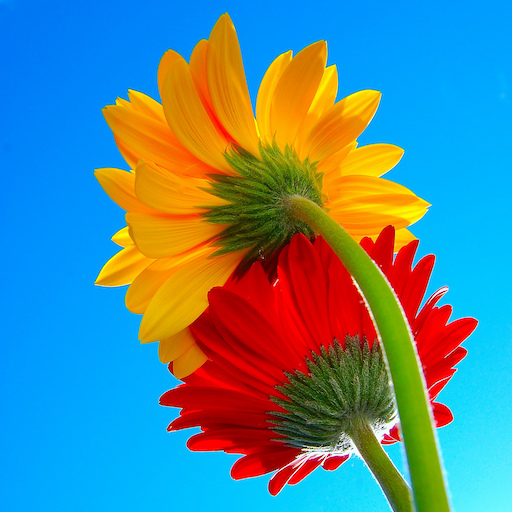

tamaño = (512, 512, 3)
máximo = 255
mínimo = 0


In [4]:
img_cv = imread('flowers.jpg')      # formato opencv (BGR)
cv2_imshow(img_cv)
info_img(img_cv)

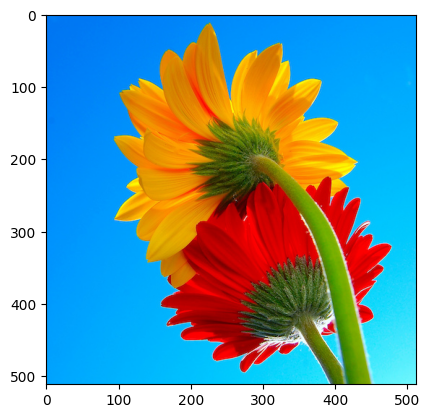

In [5]:
# Conversión BGR a RGB
img = img_cv[:,:,[2,1,0]]          # BGR a RGB
plt.imshow(img)
plt.show()

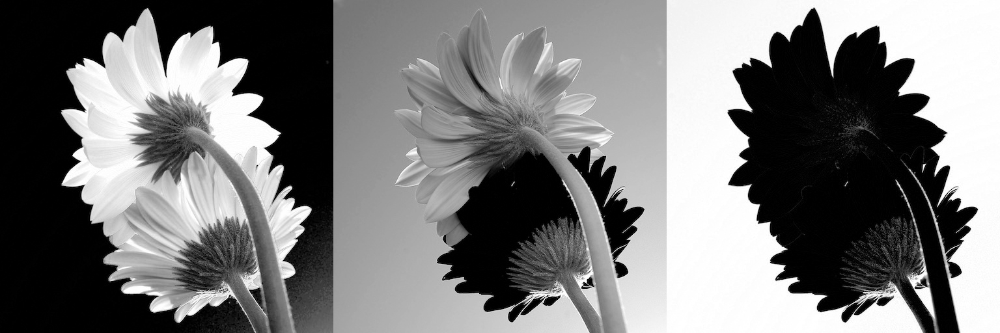

In [6]:
# Separación de canales de color
rojo = img[:,:,0]
verde = img[:,:,1]
azul = img[:,:,2]
canales = np.concatenate((rojo,verde,azul),axis=1)
cv2_imshow(canales)

tamaño = (512, 512)
máximo = 255
mínimo = 0


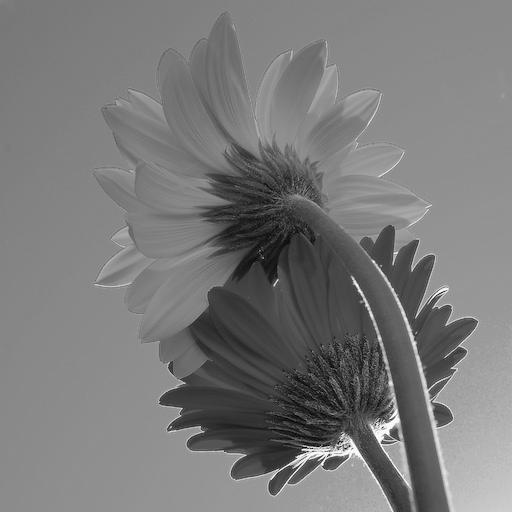

In [7]:
# Conversión a escala de grises
rojo_f = rojo.astype(float)
verde_f = verde.astype(float)
azul_f = azul.astype(float)
# Promedio ponderado
peso = (1/3,1/3,1/3)
#peso = (0.1,0.4,0.5)  # pesos alternativos
gris_f = peso[0]*rojo_f + peso[1]*verde_f + peso[2]*azul_f
gris = gris_f.astype(int)
info_img(gris)
cv2_imshow(gris)

In [8]:
# Función para mostrar histograma
def histograma(X):
    (N,M) = X.shape
    n = 256
    h = np.zeros((256,))
    for i in range(N):
        for j in range(M):
            x = X[i,j]
            h[x] = h[x]+1
    plt.plot(range(n),h[0:n])
    plt.title('Histograma')
    plt.xlabel('Valor de pixel')
    plt.ylabel('Frecuencia')
    plt.show()

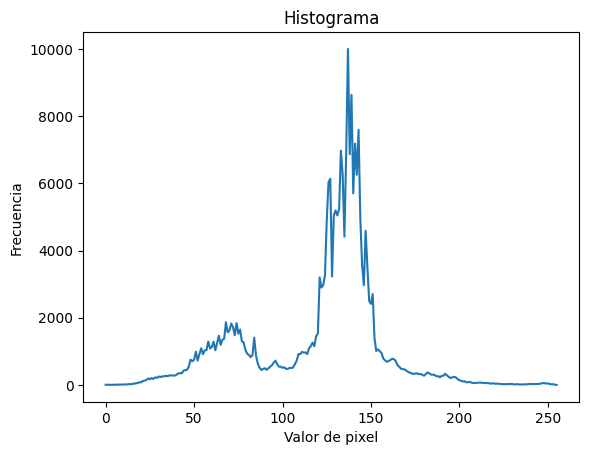

In [9]:
histograma(gris)

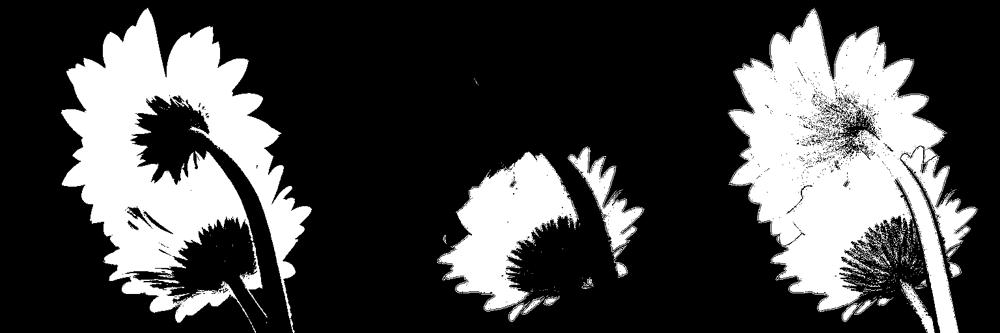

In [10]:
# Segmentación de la flor roja
seg_r = rojo>150
#seg_v = verde<40
#seg_a = azul<40
seg_v = verde<5 # Ajusto para mejorar la deteccion
seg_a = azul<10 # Ajusto para mejorar la deteccion

seg_rgb = np.concatenate((seg_r,seg_v,seg_a),axis=1)
cv2_imshow(seg_rgb*255)

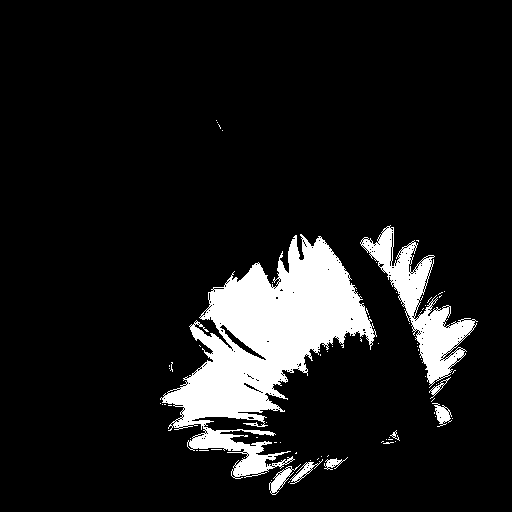

In [11]:
seg_rv = np.logical_and(seg_r,seg_v)
seg = np.logical_and(seg_rv,seg_a)
cv2_imshow(seg*255)

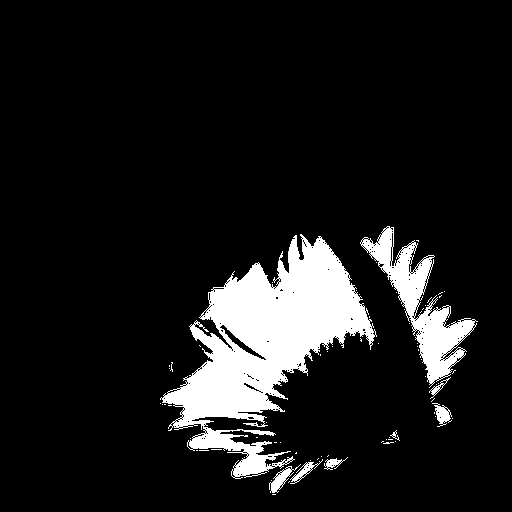

In [12]:
# Eliminación de píxeles aislados
(N,M) = seg.shape
limpia = seg.copy()
for i in range(N):
    s = np.sum(seg[i,:])
    #if s<10:
    if s<3: # Ajusto para evitar la pardida de parte de los petalos
        limpia[i,:] = 0
cv2_imshow(limpia*255)

In [13]:
# Búsqueda de coordenadas del rectángulo
i_min = 1000
i_max = 0
j_min = 1000
j_max = 0
for i in range(N):
    for j in range(M):
        if limpia[i,j]>0:
            if i<i_min: i_min = i
            if i>i_max: i_max = i
            if j<j_min: j_min = j
            if j>j_max: j_max = j

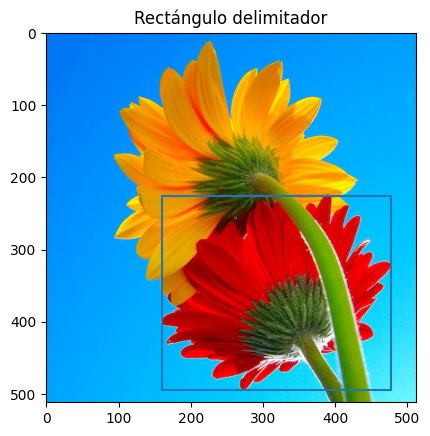

In [14]:
# Dibujo del rectángulo
y = [i_min,i_min,i_max,i_max,i_min]
x = [j_min,j_max,j_max,j_min,j_min]
plt.imshow(img)
plt.plot(x,y)
plt.title('Rectángulo delimitador')
plt.show()

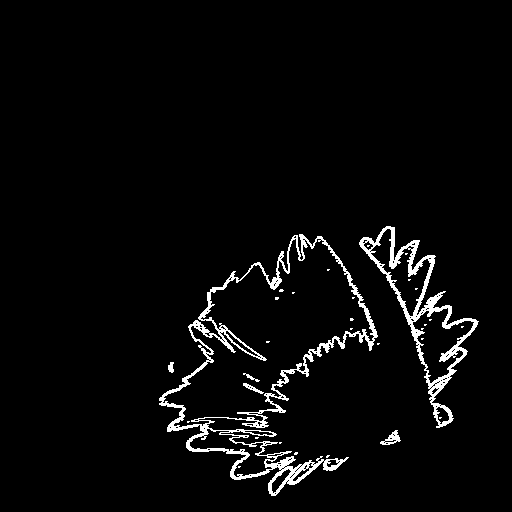

In [15]:
# Detección de bordes
borde = np.zeros((N,M),np.uint8)
# Bordes horizontales
for i in range(N):
    for j in range(1,M):
        if limpia[i,j]!=limpia[i,j-1]:
            borde[i,j] = 1
            borde[i,j-1] = 1
# Bordes verticales
for i in range(1,N):
    for j in range(M):
        if limpia[i-1,j]!=limpia[i,j]:
            borde[i,j] = 1
            borde[i,j-1] = 1
cv2_imshow(borde*255)

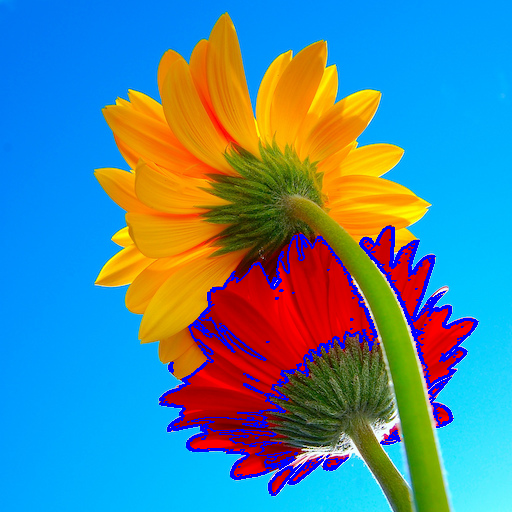

In [16]:
# Resultado final con bordes en rojo
img_final = img_cv.copy()
for i in range(N):
    for j in range(M):
        if borde[i,j]==1:
            img_final[i,j,:] = [255,0,0]
cv2_imshow(img_final)

#Prueba de Segmentacion con otra imagen
Se intentará segmentar el gato gris

--2025-04-12 11:57:09--  https://www.zooplus.es/magazine/wp-content/uploads/2020/02/korat-katze-1024x683.jpeg
Resolving www.zooplus.es (www.zooplus.es)... 108.138.106.27, 108.138.106.36, 108.138.106.123, ...
Connecting to www.zooplus.es (www.zooplus.es)|108.138.106.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 108716 (106K) [image/jpeg]
Saving to: ‘gato-gris.jpg’

gato-gris.jpg       100%[===================>] 106.17K   607KB/s    in 0.2s    

2025-04-12 11:57:10 (607 KB/s) - ‘gato-gris.jpg’ saved [108716/108716]



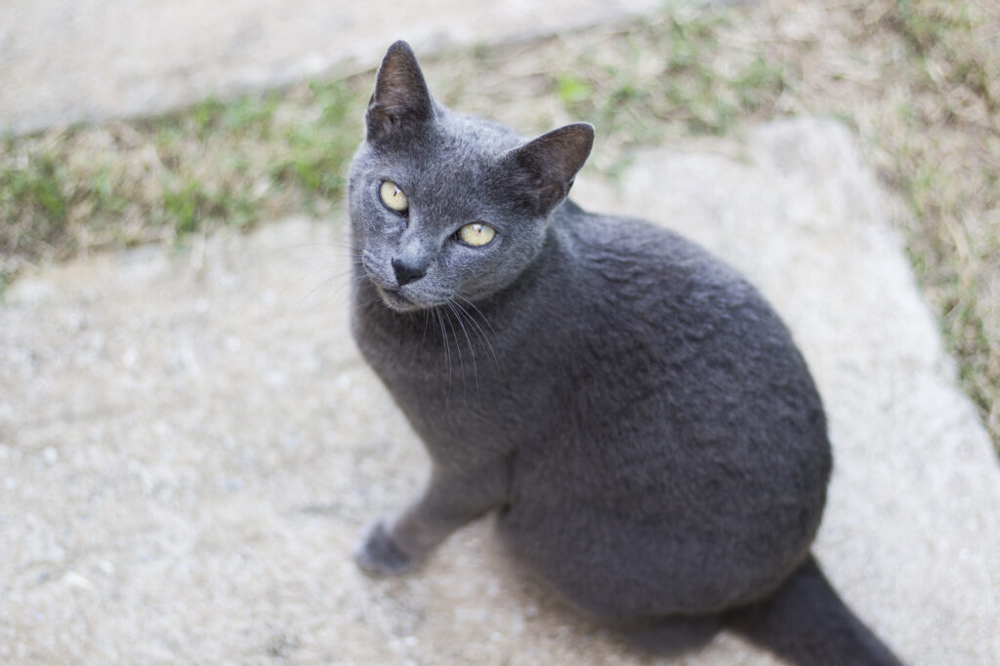

tamaño = (683, 1024, 3)
máximo = 249
mínimo = 9


In [17]:
!wget -O gato-gris.jpg https://www.zooplus.es/magazine/wp-content/uploads/2020/02/korat-katze-1024x683.jpeg
img_cv = imread('gato-gris.jpg')      # formato opencv (BGR)
cv2_imshow(img_cv)
info_img(img_cv)

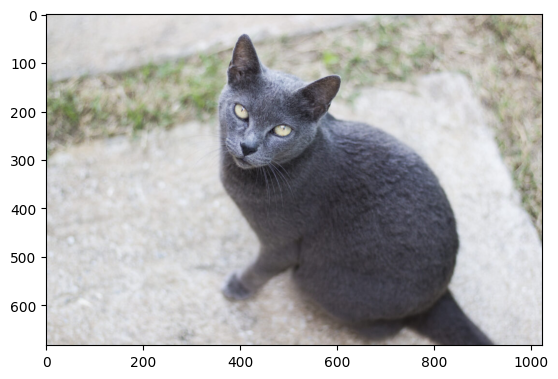

In [18]:
# Conversión BGR a RGB
img = img_cv[:,:,[2,1,0]]          # BGR a RGB
plt.imshow(img)
plt.show()

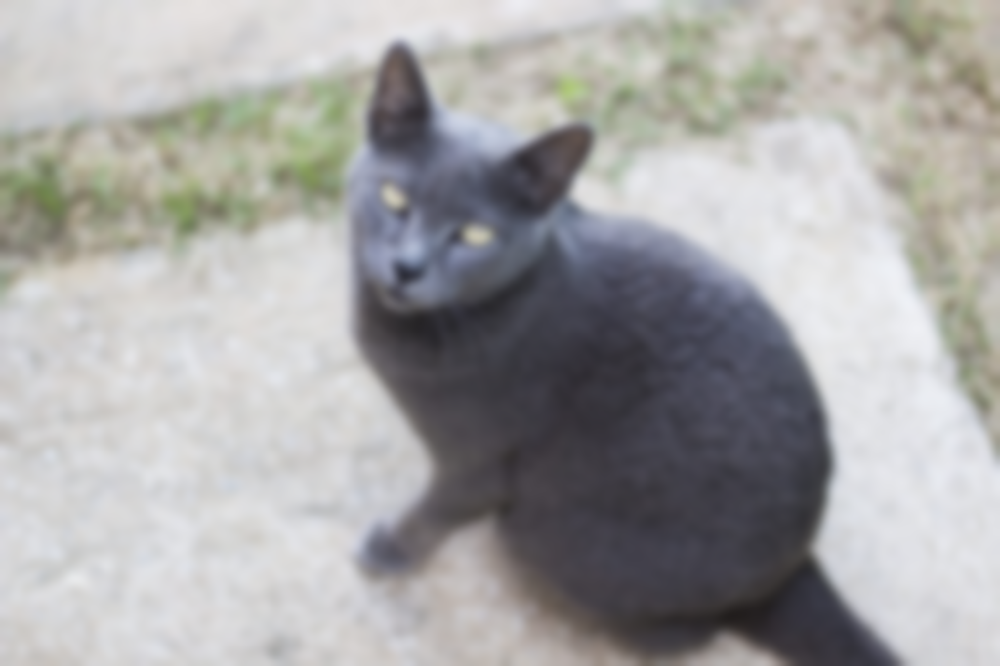

In [19]:
# Aplicar desenfoque gaussiano
img2 = cv2.GaussianBlur(img_cv, (21, 21), 5)  # Ajusta el tamaño del kernel (5, 5) y la desviación estándar (0) según sea necesario

# Mostrar la imagen con desenfoque
cv2_imshow(img2)


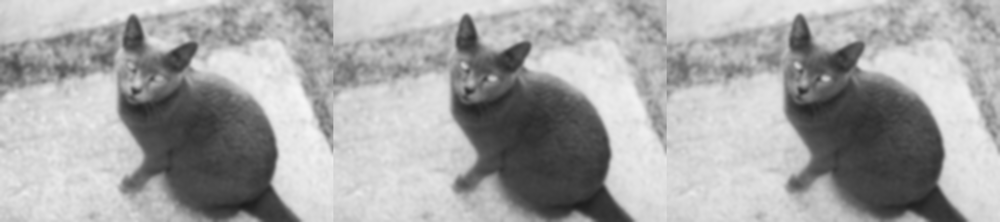

In [20]:
# Separación de canales de color
rojo = img2[:,:,0]
verde = img2[:,:,1]
azul = img2[:,:,2]
canales = np.concatenate((rojo,verde,azul),axis=1)
cv2_imshow(canales)

tamaño = (683, 1024)
máximo = 241
mínimo = 30


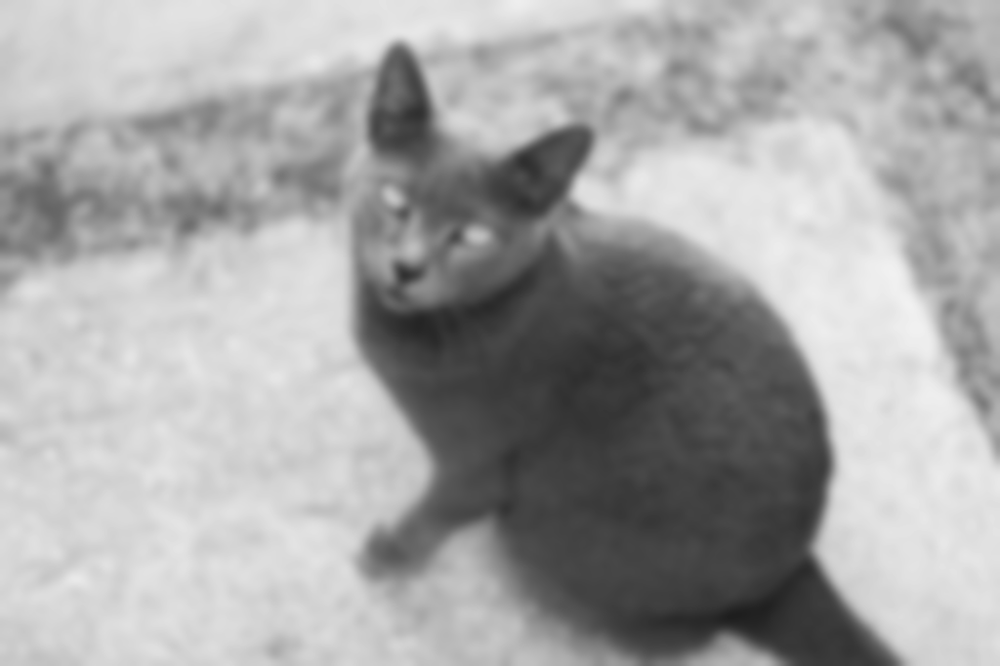

In [21]:
# Conversión a escala de grises
rojo_f = rojo.astype(float)
verde_f = verde.astype(float)
azul_f = azul.astype(float)
# Promedio ponderado
peso = (1/3,1/3,1/3)
#peso = (0.1,0.4,0.5)  # pesos alternativos
gris_f = peso[0]*rojo_f + peso[1]*verde_f + peso[2]*azul_f
gris = gris_f.astype(int)
info_img(gris)
cv2_imshow(gris)

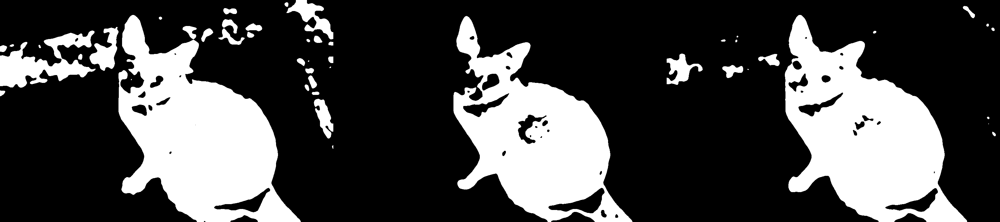

In [22]:
#Aca viene el desafio!!!
# Segmentación del gato gris
seg_r = (rojo > 50) & (rojo < 150)
seg_v = (verde > 50) & (verde < 110)
seg_a = (azul > 50) & (azul < 140)


seg_rgb = np.concatenate((seg_r,seg_v,seg_a),axis=1)
cv2_imshow(seg_rgb*255)

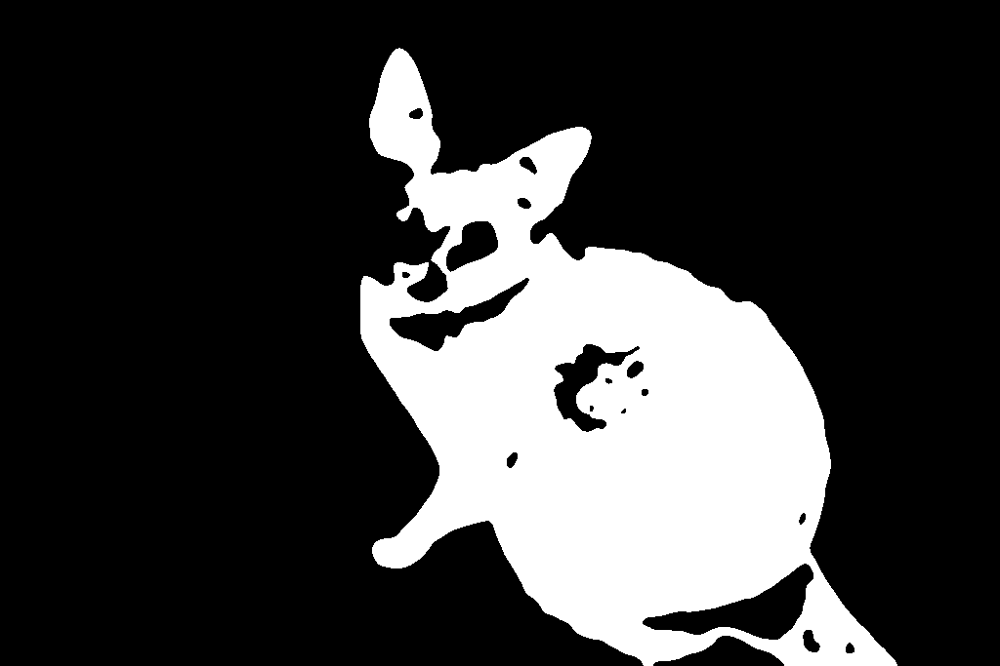

In [23]:
seg_rv = np.logical_and(seg_r,seg_v)
seg = np.logical_and(seg_rv,seg_a)
cv2_imshow(seg*255)

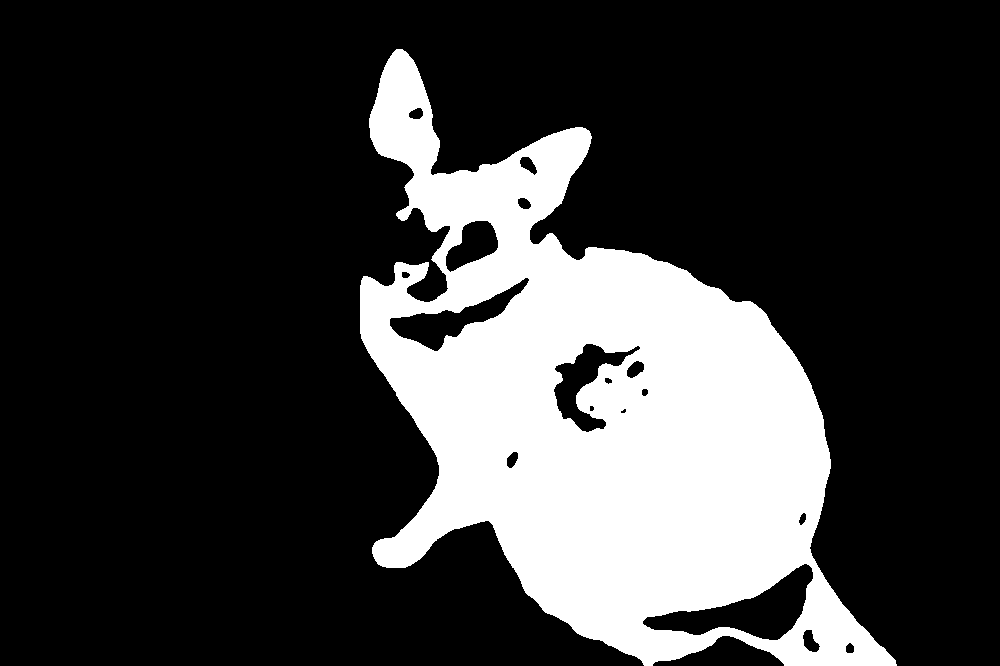

In [24]:
# Eliminación de píxeles aislados Horizontales
(N,M) = seg.shape
limpia = seg.copy()
for i in range(N):
    s = np.sum(seg[i,:])
    if s<5:
        limpia[i,:] = 0
cv2_imshow(limpia*255)

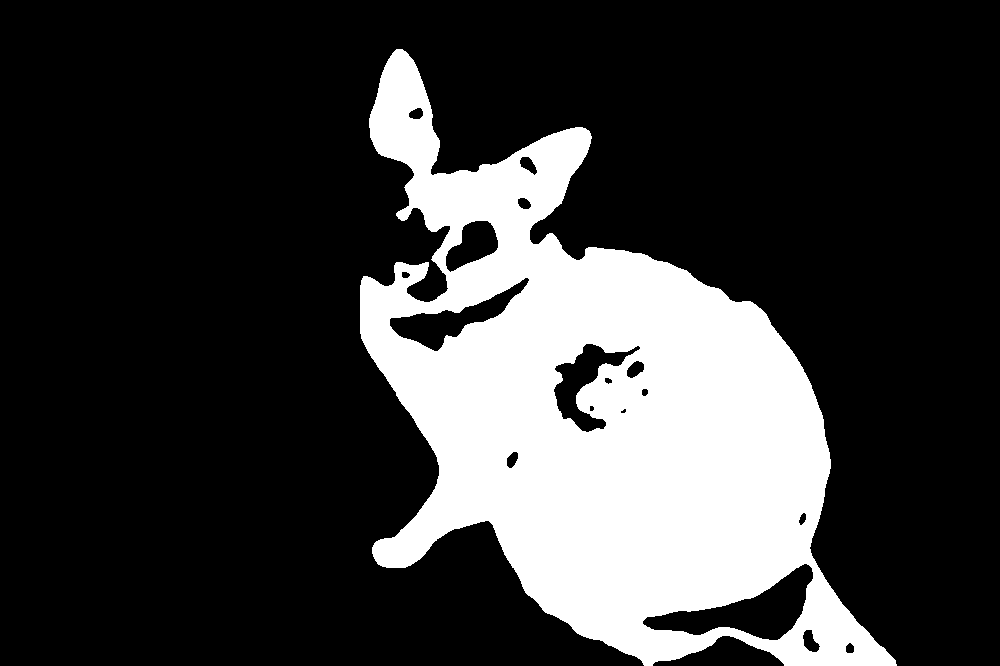

In [25]:
# Eliminación de píxeles aislados Verticales
(N,M) = seg.shape
limpia = limpia.copy()
for i in range(N):
    s = np.sum(seg[:,i])
    if s<5:
        limpia[:,i] = 0
cv2_imshow(limpia*255)

In [26]:
# Búsqueda de coordenadas del rectángulo
i_min = 1000
i_max = 0
j_min = 1000
j_max = 0
for i in range(N):
    for j in range(M):
        if limpia[i,j]>0:
            if i<i_min: i_min = i
            if i>i_max: i_max = i
            if j<j_min: j_min = j
            if j>j_max: j_max = j

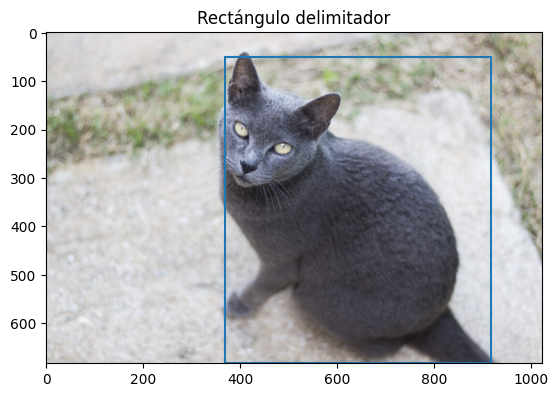

In [27]:
# Dibujo del rectángulo
y = [i_min,i_min,i_max,i_max,i_min]
x = [j_min,j_max,j_max,j_min,j_min]
plt.imshow(img)
plt.plot(x,y)
plt.title('Rectángulo delimitador')
plt.show()

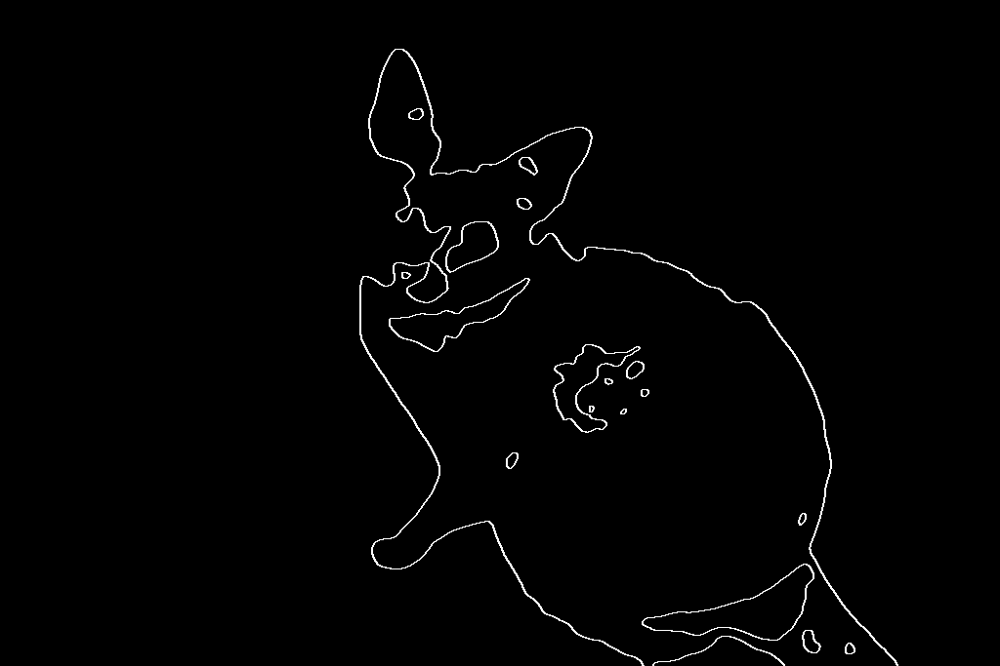

In [28]:
# Detección de bordes
borde = np.zeros((N,M),np.uint8)
# Bordes horizontales
for i in range(N):
    for j in range(1,M):
        if limpia[i,j]!=limpia[i,j-1]:
            borde[i,j] = 1
            borde[i,j-1] = 1
# Bordes verticales
for i in range(1,N):
    for j in range(M):
        if limpia[i-1,j]!=limpia[i,j]:
            borde[i,j] = 1
            borde[i,j-1] = 1
cv2_imshow(borde*255)

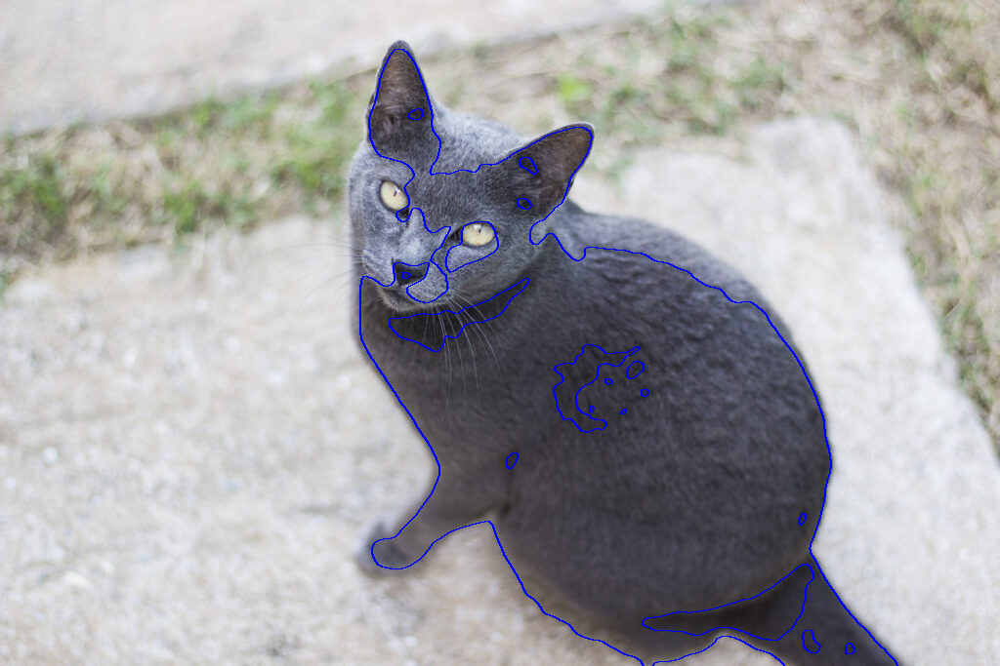

In [29]:
# Resultado final con bordes en rojo
img_final = img_cv.copy()
for i in range(N):
    for j in range(M):
        if borde[i,j]==1:
            img_final[i,j,:] = [255,0,0]
cv2_imshow(img_final)

## Prueba de segmentacion de auto amarillo

--2025-04-12 13:06:35--  https://i.pinimg.com/1200x/ab/a7/d4/aba7d45fc60d96af2330a06640e774d1.jpg
Resolving i.pinimg.com (i.pinimg.com)... 151.101.0.84, 151.101.64.84, 151.101.128.84, ...
Connecting to i.pinimg.com (i.pinimg.com)|151.101.0.84|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 28694 (28K) [image/jpeg]
Saving to: ‘auto-amaarillo.jpg’

auto-amaarillo.jpg  100%[===================>]  28.02K  --.-KB/s    in 0s      

2025-04-12 13:06:35 (131 MB/s) - ‘auto-amaarillo.jpg’ saved [28694/28694]



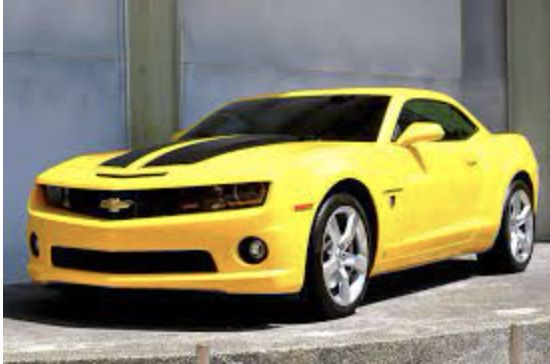

tamaño = (364, 550, 3)
máximo = 255
mínimo = 0


In [176]:
!wget -O auto-amaarillo.jpg https://i.pinimg.com/1200x/ab/a7/d4/aba7d45fc60d96af2330a06640e774d1.jpg
img_cv = imread('auto-amaarillo.jpg')      # formato opencv (BGR)
cv2_imshow(img_cv)
info_img(img_cv)

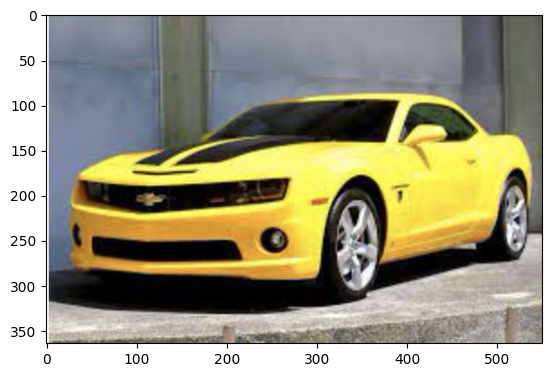

In [214]:
# Conversión BGR a RGB
img = img_cv[:,:,[2,1,0]]          # BGR a RGB
plt.imshow(img)
plt.show()

In [95]:
#Reduce los tonos de la por canal de unaimagen
def reducirTonos(matriz, tonos):

    # Calcular el factor de escala
    factor_escala = 255 / (tonos - 1) if tonos > 1 else 1

    # Iterar sobre la matriz y reescalar los valores
    for i in range(matriz.shape[0]):
        for j in range(matriz.shape[1]):
            nuevo_valor = int(round(matriz[i, j] / factor_escala) * factor_escala)
            matriz[i, j] = np.clip(nuevo_valor, 0, 255)  # Asegurar que los valores estén en el rango 0-255

    return matriz

#Devuelve una imagen de 3 canales donde se reducen los tonos de cada canal de forma separada
def reduceCanales(imagen,tonos):
    imagen_R=imagen[:,:,0]
    imagen_G=imagen[:,:,1]
    imagen_B=imagen[:,:,2]
    imagen_R=reducirTonos(imagen_R.copy(),tonos)
    imagen_G=reducirTonos(imagen_G.copy(),tonos)
    imagen_B=reducirTonos(imagen_B.copy(),tonos)
    imagen_bgr=np.dstack((imagen_B,imagen_G,imagen_R))
    imagen_rgb=np.dstack((imagen_R,imagen_G,imagen_B))
    # Obtener valores únicos para cada canal
    valores_rojo = np.unique(imagen_R)
    valores_verde = np.unique(imagen_G)
    valores_azul = np.unique(imagen_B)

    # Imprimir los valores únicos para cada canal
    print("Valores únicos en el canal rojo:", valores_rojo)
    print("Valores únicos en el canal verde:", valores_verde)
    print("Valores únicos en el canal azul:", valores_azul)
    return imagen_rgb

Valores únicos en el canal rojo: [  0  36  72 109 145 182 218 255]
Valores únicos en el canal verde: [  0  36  72 109 145 182 218 255]
Valores únicos en el canal azul: [  0  36  72 109 145 182 218 255]


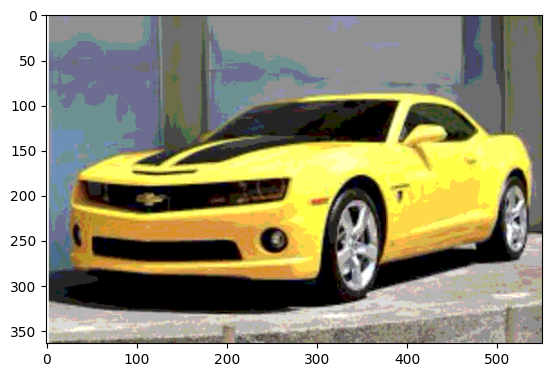

In [215]:
# reduzco la cantidad de tonos por canal
img2 = reduceCanales(img,8)
plt.imshow(img2)
plt.show()


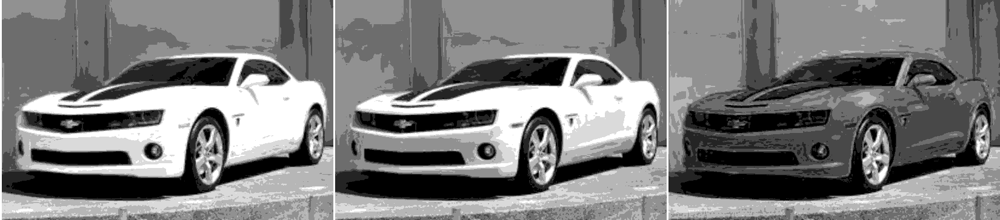

In [216]:
# Separación de canales de color
rojo = img2[:,:,0]
verde = img2[:,:,1]
azul = img2[:,:,2]
canales = np.concatenate((rojo,verde,azul),axis=1)
cv2_imshow(canales)

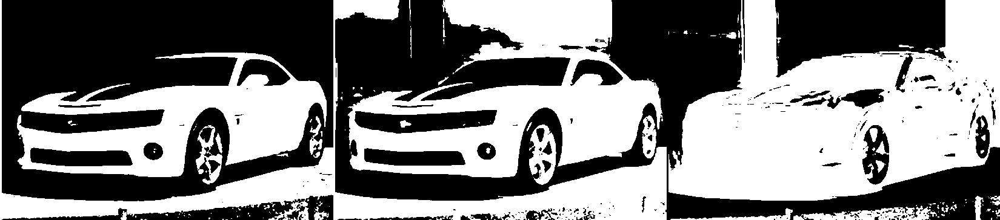

In [217]:
# Segmentación del auto amarillo
seg_r = (rojo >= 170) & (verde >= 109)
seg_v = (verde >= 109) & (rojo > 109)
seg_a = (azul <= 109)


seg_rgb = np.concatenate((seg_r,seg_v,seg_a),axis=1)
cv2_imshow(seg_rgb*255)

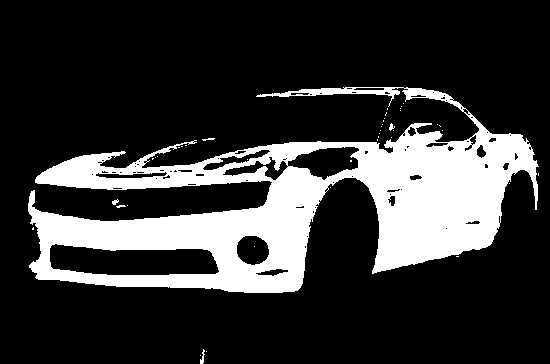

In [218]:
seg_rv = np.logical_and(seg_r,seg_v)
seg = np.logical_and(seg_rv,seg_a)
cv2_imshow(seg*255)

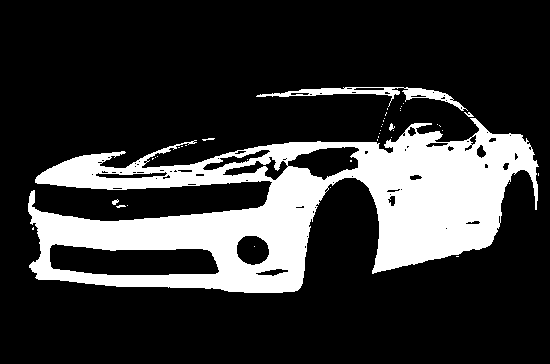

In [219]:
# Eliminación de píxeles aislados Horizontales
(N,M) = seg.shape
limpia = seg.copy()
for i in range(N):
    s = np.sum(seg[i,:])
    if s<5:
        limpia[i,:] = 0
cv2_imshow(limpia*255)

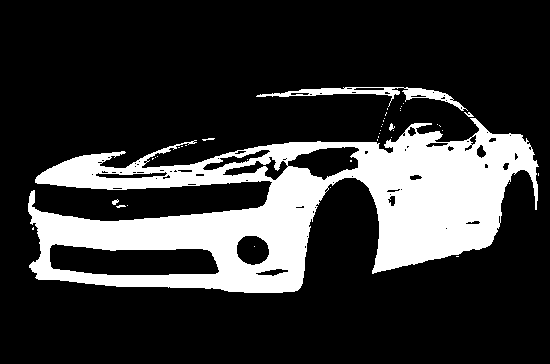

In [220]:
# Eliminación de píxeles aislados Veticales
(N,M) = limpia.shape
limpia = limpia.copy()
for i in range(N):
    s = np.sum(limpia[:,i])
    if s<5:
        limpia[:,i] = 0
cv2_imshow(limpia*255)

In [221]:
# Búsqueda de coordenadas del rectángulo
i_min = 1000
i_max = 0
j_min = 1000
j_max = 0
for i in range(N):
    for j in range(M):
        if limpia[i,j]>0:
            if i<i_min: i_min = i
            if i>i_max: i_max = i
            if j<j_min: j_min = j
            if j>j_max: j_max = j

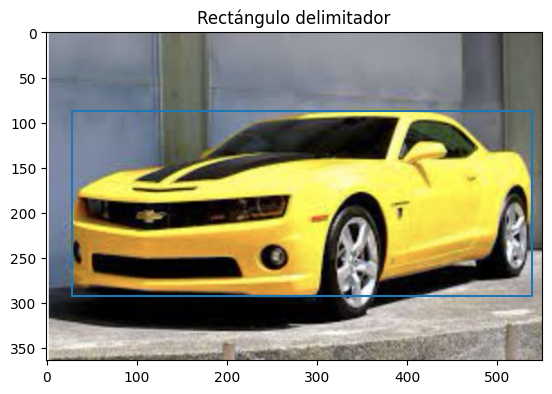

In [222]:
# Dibujo del rectángulo
y = [i_min,i_min,i_max,i_max,i_min]
x = [j_min,j_max,j_max,j_min,j_min]
plt.imshow(img)
plt.plot(x,y)
plt.title('Rectángulo delimitador')
plt.show()

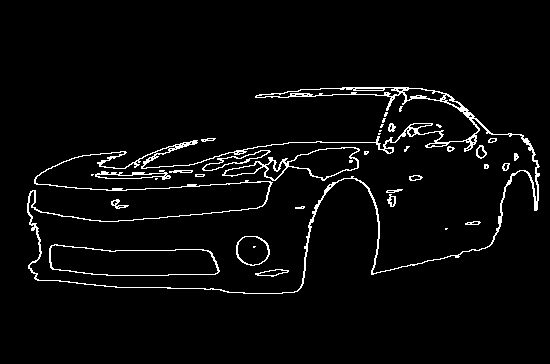

In [223]:
# Detección de bordes
borde = np.zeros((N,M),np.uint8)
# Bordes horizontales
for i in range(N):
    for j in range(1,M):
        if limpia[i,j]!=limpia[i,j-1]:
            borde[i,j] = 1
            borde[i,j-1] = 1
# Bordes verticales
for i in range(1,N):
    for j in range(M):
        if limpia[i-1,j]!=limpia[i,j]:
            borde[i,j] = 1
            borde[i,j-1] = 1
cv2_imshow(borde*255)

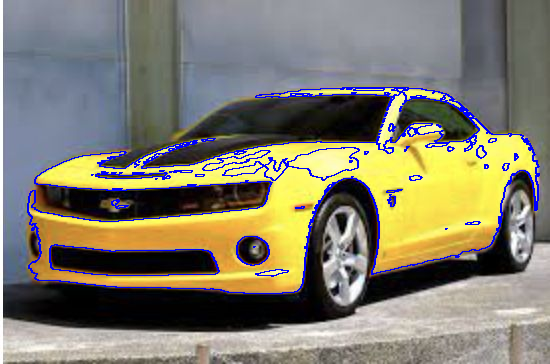

In [224]:
# Resultado final con bordes en rojo
img_final = img_cv.copy()
for i in range(N):
    for j in range(M):
        if borde[i,j]==1:
            img_final[i,j,:] = [255,0,0]
cv2_imshow(img_final)